In [2]:
import plotly.graph_objects as go
import plotly.express as px
from numpy import*
from numpy.linalg import*
from matplotlib.pyplot import*
from scipy.interpolate import Rbf
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from scipy.interpolate import griddata
import matplotlib
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import os

In [3]:
# Carregando informações geotécnicas
df = pd.read_csv('pontos_impenetravel_Acail.txt', sep=',')

In [4]:
# Transformando o sistema de coordenadas

from pyproj import Transformer

# Definindo os sistemas de coordenadas
# UTM zona 29T com WGS84
utm_wgs84 = "EPSG:32629"
# T-TM06/ETRS89
ttm06_etrs89 = "EPSG:3763"

# Inicializando o transformador
transformer = Transformer.from_crs(utm_wgs84, ttm06_etrs89)

# Criando um df com x e y para transformação
df_transformer = df[['x', 'y']]

# Converte as linhas do DataFrame para uma lista de tuplas
pontos_para_transformar = list(df_transformer.itertuples(index=False, name=None))

# Lista de pontos para converter
pontos_utm = pontos_para_transformar

# Convertendo cada ponto
pontos_transformados = [transformer.transform(x, y) for x, y in pontos_utm]

df[['x', 'y']] = pd.DataFrame(pontos_transformados, columns=['x', 'y'])

#df.head()

In [5]:
# Criando listas com x, y e labels para plotagem dos pontos no gráfico
x_= df.x.to_list()
y_= df.y.to_list()
labels = df.ponto.to_list() 
impenetravel_= df.x.to_list()

In [6]:
# Cria df para montagem da variável c1_data
df_c1_data = df[['x', 'y','impenetravel']]

In [7]:
# Converte as linhas do DataFrame para uma lista de tuplas
c1_data = list(df_c1_data.itertuples(index=False, name=None))

In [8]:
# Carrega df com o perímetro
df_perimetro = pd.read_csv('perimetro.txt', sep=',')

In [9]:
# Criando listas com x_perimetro e y_perimetro
x_perimetro = df_perimetro.x.to_list()
y_perimetro = df_perimetro.y.to_list()

In [10]:
# Converte as linhas do DataFrame para uma lista de tuplas
perimetro = list(df_perimetro.itertuples(index=False, name=None))

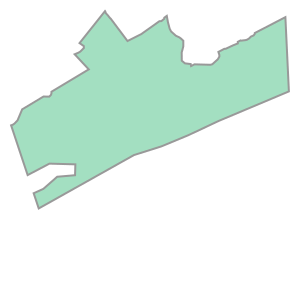

In [11]:
# Cria polígono correspondente à área do parque
polygon = Polygon(perimetro)
polygon

In [12]:
# Cria malha para cálculo das profundidades extrapoladas
x, y, d =zip(*c1_data)

rbfi=Rbf(x, y, d,function="linear", smoothing=0, neighbors=1)

x_min, x_max, y_min, y_max = [df_perimetro.x.min()-30, df_perimetro.x.max()+30,
                                       df_perimetro.y.min()-30, df_perimetro.y.max()+30]

xi = np.linspace(x_min, x_max, 400)
yi = np.linspace(y_min, y_max, 400)
xx, yy = np.meshgrid(xi, yi)

di = rbfi(xx, yy)

In [13]:
# Elimina pontos fora do perímetro do parque da malha
for i in range(len(xi)):
    for j in range(len(yi)):
        
        if polygon.contains(Point(xx[i][j], yy[i][j]))==True:
            di[i][j]= di[i][j]
        else:
            di[i][j]= None

In [14]:
# Gera gráfico com a superfície do topo de rocha, pontos de sondagem e perímetro do parque
fig = go.Figure()

fig.add_trace(go.Contour(
    x=xi,
    
    y=yi,
    
    z=di,
    colorscale="Cividis",
     contours=dict(
            #coloring ='heatmap',
            showlabels = False, # show labels on contours
            labelfont = dict( # label font properties
                size = 12,
                color = 'white',
            )
        ),
    colorbar=dict(
            title='', # title here
            titleside='right',
            titlefont=dict(
                size=14,
                family='Arial, sans-serif')
        ),
    connectgaps=False,
    ncontours=7,
))

fig.add_trace(go.Scatter(x=x_,y=y_, 
    mode="markers+text",
    text=labels,  # Rótulos dos pontos
    textposition='top left',  # Posição dos rótulos (pode ser ajustada)
    textfont=dict(color='white'),  # Cor dos rótulos
    marker_size=10,
    marker =  {'color' : '#e74c3c',
        'line' : {'width': 2,
        'color': 'rgba(0,0,0,1)'}},
    opacity=.8
    ))

fig.add_trace(go.Scatter(x=x_perimetro,y=y_perimetro,   
    mode='lines',
    line_color='rgba(0,0,0,1)',
    
))

fig.update_layout(
    width = abs(x_max-x_min)*.7,
    height = abs(y_max-y_min)*.7,
    showlegend=False,
    template="simple_white",
    xaxis=dict(
        showgrid=True,        # Habilita a grade no eixo x
        gridcolor='lightgray', # Cor da grade no eixo x (opcional)
        nticks=7  # Define aproximadamente 5 ticks no eixo 
    ),
    yaxis=dict(
        showgrid=True,        # Habilita a grade no eixo y
        gridcolor='lightgray', # Cor da grade no eixo y (opcional)
        nticks=7  # Define aproximadamente 5 ticks no eixo 
    ))

fig.show()

diretorio_atual = os.getcwd()
caminho_arquivo = os.path.join(diretorio_atual, "topo_rocha_Acail.png")

# Salvando a figura como imagem PNG
#fig.write_image(caminho_arquivo)

In [15]:
# Cria df para montagem da variável c2_data
z_=df.z.to_list()
#z_min=min(z_)
#print(z_)
#for i in range(len(z)):
#    z_[i]= z_[i]-z_min
#df[['z']] = pd.DataFrame(z_, columns=['z'])

df_c2_data = df[['x', 'y','z']]

In [16]:
# Converte as linhas do DataFrame para uma lista de tuplas
c2_data = list(df_c2_data.itertuples(index=False, name=None))

In [17]:
# Cálculo das elevações extrapoladas
x, y, z =zip(*c2_data)
rbfi_z=Rbf(x, y, z,function="linear", smoothing=0, neighbors=1)
zi = rbfi_z(xx, yy)

In [18]:
# Elimina pontos fora do perímetro do parque da malha
for i in range(len(xi)):
    for j in range(len(yi)):
        
        if polygon.contains(Point(xx[i][j], yy[i][j]))==True:
            zi[i][j]= zi[i][j]
        else:
            zi[i][j]= None

In [19]:
# Cálculo da superfície de rocha relativa à superfície
z_topo_relativo = zi - min(zi)
z_relativo = z_topo_relativo-di*10-10

In [20]:
fig = go.Figure(data=[go.Surface(x=xi,y=yi,z=di,showscale=False,colorscale='Cividis'),
                     go.Surface(x=xi,y=yi,z=zi,showscale=False,colorscale='jet_r'),
                     ])

fig.update_traces(contours_z=dict(show=False, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))


fig.update_layout(title='', autosize=False,
                width=abs(x_max-x_min)*.7,
                height=abs(y_max-y_min)*.7,
                margin=dict(l=65, r=50, b=65, t=90),
                template="simple_white",  
                scene = dict(
                    xaxis=dict(
                        visible=False,          # Desabilita o eixo x
                        showticklabels=False    # Remove rótulos do eixo x
                    ),
                    yaxis=dict(
                        visible=False,          # Desabilita o eixo y
                        showticklabels=False    # Remove rótulos do eixo y
                    ),
                    zaxis=dict(
                        visible=False,          # Desabilita o eixo z
                        showticklabels=False    # Remove rótulos do eixo z
                    ),
                    camera_eye=dict(x=0,y=-1,z=0.5),
                    aspectratio=dict(x=1,y=1,z=0.2)
                    ))        

fig.show()

In [ ]:
# Gerando .txt para exportação

x_min, x_max, y_min, y_max = [df_perimetro.x.min()-30, df_perimetro.x.max()+30,
                                       df_perimetro.y.min()-30, df_perimetro.y.max()+30]

xi = np.linspace(x_min, x_max, 252) # grid de 5 em 5 m
yi = np.linspace(y_min, y_max, 182) # grid de 5 em 5 m
xx, yy = np.meshgrid(xi, yi)

matriz_combinada = np.column_stack((xx.ravel(), yy.ravel(), rbfi(xx.ravel(), yy.ravel())))

nome_arquivo = "topo_rocha_Acail.txt"

# Salvando a matriz no arquivo CSV
np.savetxt(nome_arquivo, matriz_combinada, delimiter=',')

print(f'Matriz salva em {nome_arquivo}')



Matriz salva em topo_rocha_Acail.txt
